---
## **Visualization of CNN: Grad-CAM**

By. Nan CHEN and Haiwei FU


---
---


* **Objective**: Convolutional Neural Networks are widely used on computer vision. It is powerful for processing grid-like data. However we hardly know how and why it works, due to the lack of decomposability into individually intuitive components. In this assignment, we use Grad-CAM, which highlights the regions of the input image that were important for the neural network prediction.


* NB: if `PIL` is not installed, try `conda install pillow`.

In [2]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Not connected to a GPU


In [3]:
from google.colab import drive
drive.mount('/content/drive')

path = "/content/drive/MyDrive/Colab Notebooks/TP2_images"

Mounted at /content/drive


In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, datasets, transforms
import matplotlib.pyplot as plt
import pickle
import urllib.request

import numpy as np
from PIL import Image

%matplotlib inline

### Download the Model
We provide you a pretrained model `ResNet-34` for `ImageNet` classification dataset.
* **ImageNet**: A large dataset of photographs with 1 000 classes.
* **ResNet-34**: A deep architecture for image classification.

In [5]:
resnet34 = models.resnet34(pretrained=True)
resnet34.eval() # set the model to evaluation mode

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

![ResNet34](https://miro.medium.com/max/1050/1*Y-u7dH4WC-dXyn9jOG4w0w.png)


Input image must be of size (3x224x224). 

First convolution layer with maxpool. 
Then 4 ResNet blocks. 

Output of the last ResNet block is of size (512x7x7). 

Average pooling is applied to this layer to have a 1D array of 512 features fed to a linear layer that outputs 1000 values (one for each class). No softmax is present in this case. We have already the raw class score!

In [6]:
classes = pickle.load(urllib.request.urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl'))

##classes is a dictionary with the name of each class 
print(classes)

{0: 'tench, Tinca tinca', 1: 'goldfish, Carassius auratus', 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 3: 'tiger shark, Galeocerdo cuvieri', 4: 'hammerhead, hammerhead shark', 5: 'electric ray, crampfish, numbfish, torpedo', 6: 'stingray', 7: 'cock', 8: 'hen', 9: 'ostrich, Struthio camelus', 10: 'brambling, Fringilla montifringilla', 11: 'goldfinch, Carduelis carduelis', 12: 'house finch, linnet, Carpodacus mexicanus', 13: 'junco, snowbird', 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 15: 'robin, American robin, Turdus migratorius', 16: 'bulbul', 17: 'jay', 18: 'magpie', 19: 'chickadee', 20: 'water ouzel, dipper', 21: 'kite', 22: 'bald eagle, American eagle, Haliaeetus leucocephalus', 23: 'vulture', 24: 'great grey owl, great gray owl, Strix nebulosa', 25: 'European fire salamander, Salamandra salamandra', 26: 'common newt, Triturus vulgaris', 27: 'eft', 28: 'spotted salamander, Ambystoma maculatum', 29: 'axolotl, mu

### Input Images
We provide you 20 images from ImageNet (download link on the webpage of the course or download directly using the following command line,).<br>
In order to use the pretrained model resnet34, the input image should be normalized using `mean = [0.485, 0.456, 0.406]`, and `std = [0.229, 0.224, 0.225]`, and be resized as `(224, 224)`.

In [7]:
def preprocess_image(dir_path):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])

    dataset = datasets.ImageFolder(dir_path, transforms.Compose([
            transforms.Resize(256), 
            transforms.CenterCrop(224), # resize the image to 224x224
            transforms.ToTensor(), # convert numpy.array to tensor
            normalize])) #normalize the tensor

    return (dataset)

In [8]:
# The images should be in a *sub*-folder of "data/" (ex: data/TP2_images/images.jpg) and *not* directly in "data/"!
# otherwise the function won't find them

import os
os.mkdir("data")
os.mkdir("data/TP2_images")
!cd data/TP2_images && wget "https://www.lri.fr/~gcharpia/deeppractice/2023/TP2/TP2_images.zip" && unzip TP2_images.zip
dir_path = "data/" 
dataset = preprocess_image(dir_path)

--2023-02-13 18:00:16--  https://www.lri.fr/~gcharpia/deeppractice/2023/TP2/TP2_images.zip
Resolving www.lri.fr (www.lri.fr)... 129.175.15.11
Connecting to www.lri.fr (www.lri.fr)|129.175.15.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1477062 (1.4M) [application/zip]
Saving to: ‘TP2_images.zip’

TP2_images.zip      100%[===================>]   1.41M  --.-KB/s    in 0.08s   

2023-02-13 18:00:17 (17.1 MB/s) - ‘TP2_images.zip’ saved [1477062/1477062]

Archive:  TP2_images.zip
   creating: .ipynb_checkpoints/
  inflating: 155881293_721e90b57d.jpg  
  inflating: 158850087_3251644046.jpg  
  inflating: 1624593475_146bf1f7ff.jpg  
  inflating: 181748579_01a4611736.jpg  
  inflating: 2068921624_ef0986de13.jpg  
  inflating: 2637374064_fab14ec0b8.jpg  
  inflating: 2749465889_8e62023674.jpg  
  inflating: 2936812850_23bf0d1cfd.jpg  
  inflating: 3532471222_a6d7e3780e.jpg  
  inflating: 3633913271_ee789a3bc4.jpg  
  inflating: 3633949157_f577605ea9.jpg  
  infla

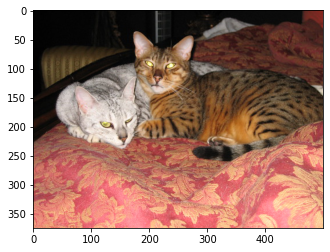

In [9]:
# show the orignal image 
index = 5
input_image = Image.open(dataset.imgs[index][0]).convert('RGB')
plt.imshow(input_image)

In [10]:
output = resnet34(dataset[index][0].view(1, 3, 224, 224))
values, indices = torch.topk(output, 3)
print("Top 3-classes:", indices[0].numpy(), [classes[x] for x in indices[0].numpy()])
print("Raw class scores:", values[0].detach().numpy())

Top 3-classes: [285 281 282] ['Egyptian cat', 'tabby, tabby cat', 'tiger cat']
Raw class scores: [13.077121 10.977325 10.554378]


### Grad-CAM 
* **Overview:** Given an image, and a category (‘tiger cat’) as input, we forward-propagate the image through the model to obtain the `raw class scores` before softmax. The gradients are set to zero for all classes except the desired class (tiger cat), which is set to 1. This signal is then backpropagated to the `rectified convolutional feature map` of interest, where we can compute the coarse Grad-CAM localization (blue heatmap).


* **To Do**: Define your own function Grad_CAM to achieve the visualization of the given images. For each image, choose the top-3 possible labels as the desired classes. Compare the heatmaps of the three classes, and conclude. 


* **To be submitted within 2 weeks**: this notebook, **cleaned** (i.e. without results, for file size reasons: `menu > kernel > restart and clean`), in a state ready to be executed (if one just presses 'Enter' till the end, one should obtain all the results for all images) with a few comments at the end. No additional report, just the notebook!


* **Hints**: 
 + We need to record the output and grad_output of the feature maps to achieve Grad-CAM. In pytorch, the function `Hook` is defined for this purpose. Read the tutorial of [hook](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html#forward-and-backward-function-hooks) carefully. 
 + The pretrained model resnet34 doesn't have an activation function after its last layer, the output is indeed the `raw class scores`, you can use them directly. 
 + The size of feature maps is 7x7, so your heatmap will have the same size. You need to project the heatmap to the resized image (224x224, not the original one, before the normalization) to have a better observation. The function [`torch.nn.functional.interpolate`](https://pytorch.org/docs/stable/nn.functional.html?highlight=interpolate#torch.nn.functional.interpolate) may help.  
 + Here is the link of the paper [Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/pdf/1610.02391.pdf)

Class: ‘pug, pug-dog’ | Class: ‘tabby, tabby cat’
- | - 
![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/dog.jpg)| ![alt](https://raw.githubusercontent.com/jacobgil/pytorch-grad-cam/master/examples/cat.jpg)

---
## **Grad-Cam** 🦄🦄🦄

---


In [38]:
#import libraries.
import cv2
from skimage import exposure 

In [39]:
#~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~
### Grad Cam ### ``.
#~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~
def Grad_Cam(image,category):

  # functions(hooks) to extract gradients and features 
  def _backward_hook(model, grad_input, grad_output):
    gradients.append(grad_output[0])

  def _forward_hook(model, input, output):
    features.append(output.data)

  features = []
  gradients = []

  # Hooks for the gradients and features 
  hook1 = model.layer4[2].bn2.register_backward_hook(_backward_hook)
  hook2 = model.layer4[2].bn2.register_forward_hook(_forward_hook)
  
  # Extract last predicted layer 
  output = model(image)

  # Create signal 
  signal = np.zeros((1, output.size()[-1]), dtype=np.float32)
  signal[0][category] = 1
  signal = torch.from_numpy(signal).requires_grad_(True)
  signal = torch.sum(signal * output)

  # Backpropagate signal
  model.zero_grad()
  signal.backward(retain_graph=True) 

  # Extract gradients and features 
  gradients = gradients[0][-1].numpy()
  features = features[0][-1].numpy()

  # Compute weights using gradients 
  Weights = np.mean(gradients, axis=(1,2))

  # Initiate a heatmap
  heatmap = np.zeros(features.shape[1:]) 

  # Remove Hooks 
  hook1.remove()
  hook2.remove()

  # Compute heatmap 
  for i in range(Weights.shape[0]): 
      heatmap += Weights[i] * features[i, :, :]

  # ReLU on top of the heatmap
  heatmap = np.maximum(heatmap, 0) 

  # Interpolate values 
  heatmap = torch.from_numpy(heatmap.reshape(1,1,7,7))
  heatmap = F.interpolate(heatmap, scale_factor=32, mode='bicubic') #Down/up samples the input, include: nearest, linear (3D-only), bilinear, bicubic (4D-only), trilinear (5D-only), area, nearest-exact.
  heatmap = heatmap.numpy()[0,0,:,:]

  # Normalize the heatmap
  heatmap = heatmap / np.max(heatmap)

  return heatmap

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.8/dist-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward ho

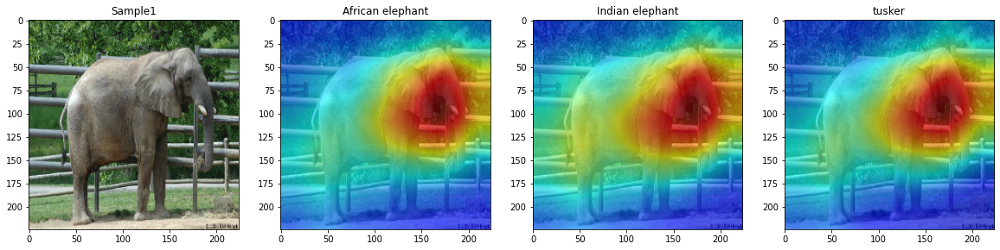

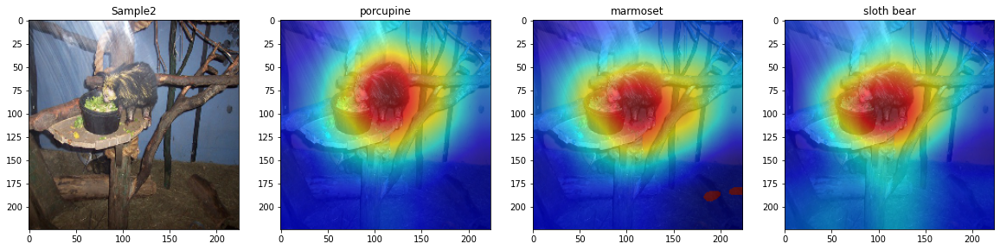

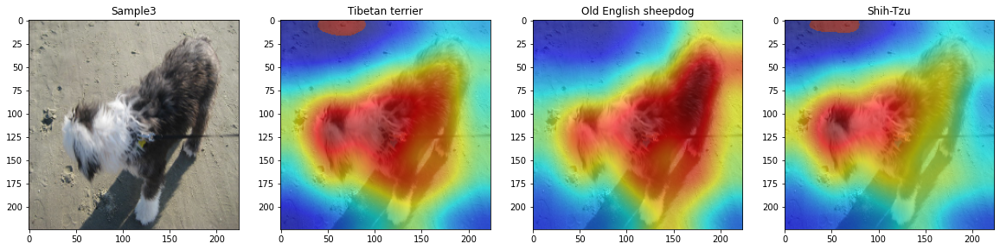

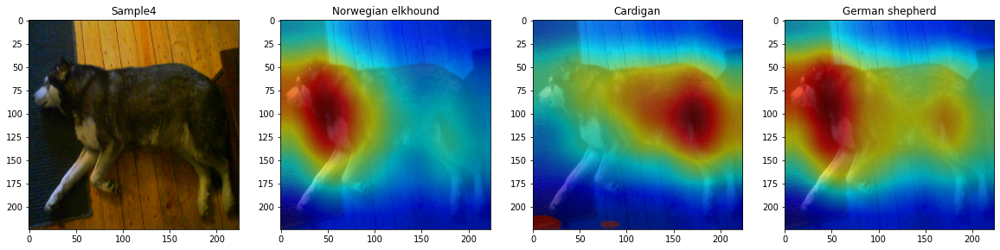

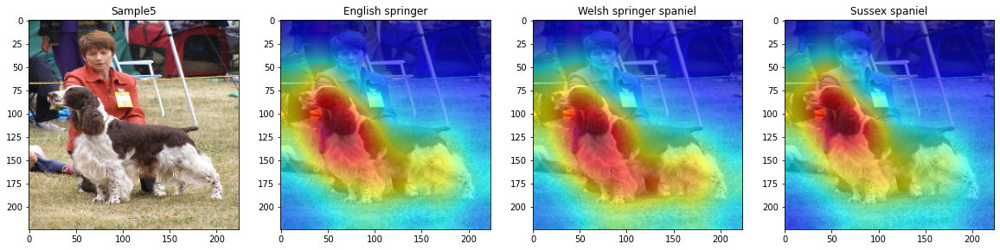

...

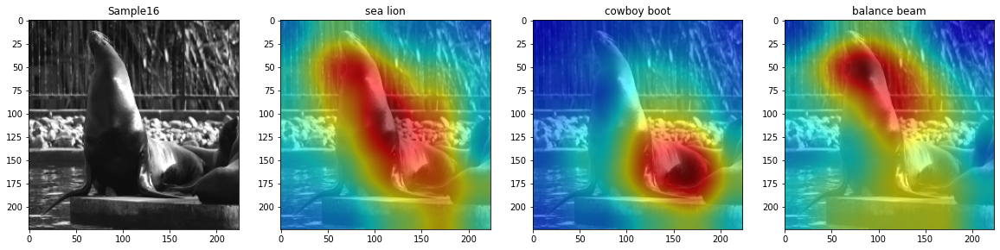

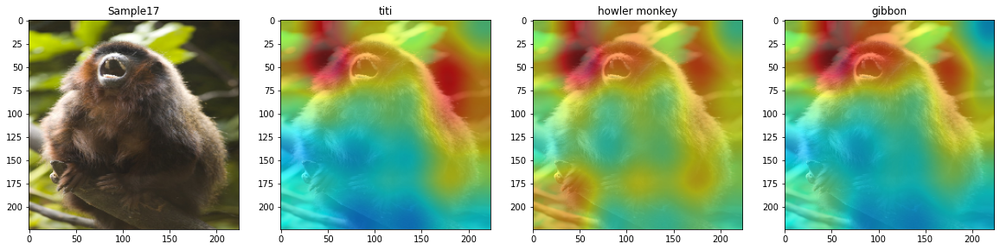

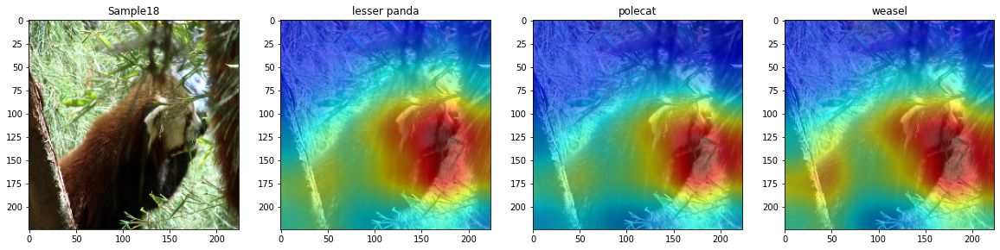

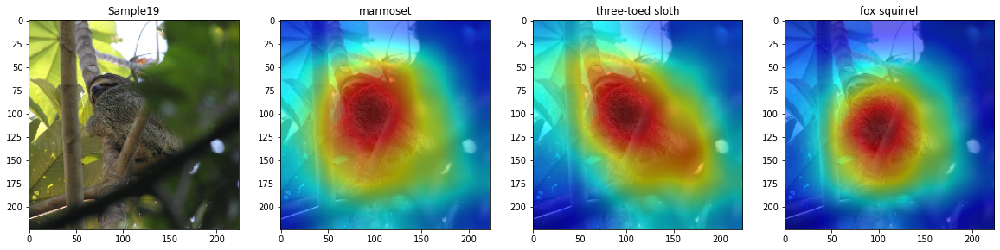

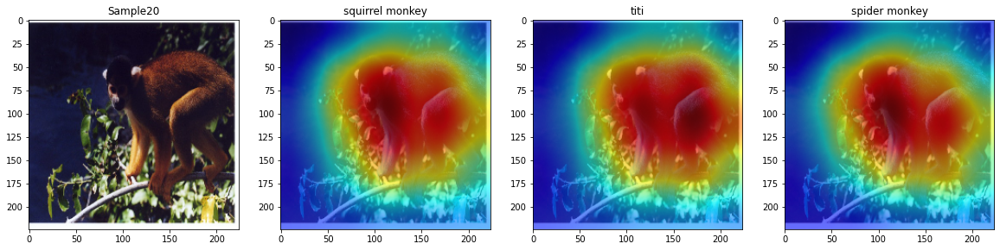

In [40]:
#~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~
### Combine an image with its heatmap ### ``.
#~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~

def apply_heatmap(img, map):
  # Construct a color map
  heatmap = cv2.applyColorMap(np.uint8(255*map), cv2.COLORMAP_JET) 
  heatmap = np.float32(heatmap) / 255

  # Merge the image with its heatmap
  merged_image = cv2.addWeighted(heatmap, 0.6, img, 0.4, 0.0)
  merged_image = np.uint8(255 * merged_image[:, :, ::-1])

  return merged_image
  

#~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~
### Traversing the first 20 samples### ``.
#~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~..*~~+++~~~~~~

for i in range(20):
  img = np.array(Image.open(dataset.imgs[i][0]).convert('RGB'))
  img = np.float32(cv2.resize(img, (224, 224))) / 255
  input = dataset[i][0].view(1, 3, 224, 224)

  model = models.resnet34(pretrained=True)
  model.eval()

  # Get the output of the model prediction
  output = model(input)
  values, indices = torch.topk(output,3)

  f, ax = plt.subplots(1,4,figsize=(20,5))
  ax[0].imshow(img)
  ax[0].set_title('Sample' + str(i+1))
  for j in range(1,4): 

    # Get the top 3 highest predicted categories
    category = indices[0].numpy()[j-1]
    heatmap = Grad_Cam(input, category)
    merged_img = apply_heatmap(img,heatmap)
    ax[j].imshow(merged_img)
    names = classes[category].split(',') 
    ax[j].set_title(names[0])

  plt.show()

In order to better understand CNN, visually interpret it, and make better decisions on the model, Gradient-weighted Class Activation Mapping (Grad-CAM) is proposed. 

Paper: "Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization".
https://arxiv.org/abs/1610.02391In 

Grad-CAM can visualize CNN with any structure without modifying the network structure or retraining.

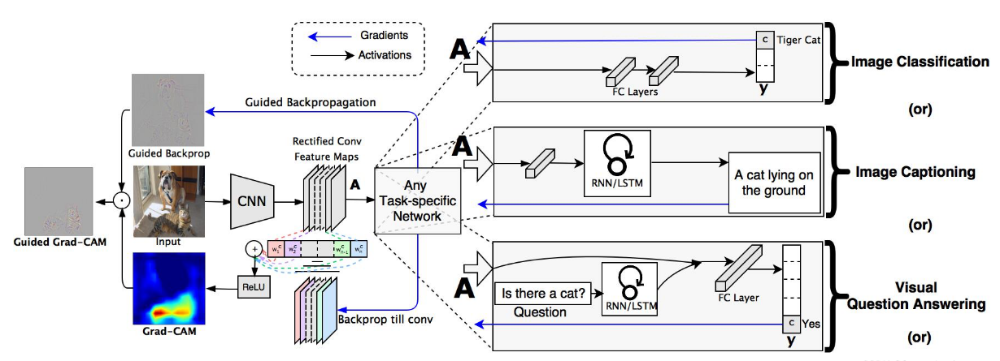

# **Analysis:**

**From the results, it can be seen that in most cases, the first predictions and heatmaps seem to be more accurate and relevant to the original image. However, in some cases, the second or third prediction is more relevant.**

- For samples 1, (3, 5), 6, (9, 18), (12, 7), 15, and (17, 20), all three
heatmaps show that the network is focusing on almost the same region for the prediction. These samples belong to the same family of mammals, such as elephants, dogs, cats, mustelids, foxes, felines, and monkeys respectively.

- For sample 2, although the network focuses on the same region in all three heatmaps, the predictions of "porcupine" and "marmoset" are relevant to the original image, but "sloth bear" is not, which can be explained by its lower score.

- For sample 4, it can be observed that the network does not focus on the same regions for different predictions. To predict "Norwegian elkhound" or "German shepherd", the network focuses on the front region, but to predict "Cardigan", it focuses on the back region of the animal.

- For sample 8, it is interesting to note that the heatmaps show that the first and second predictions are based on the foreground dog, while the third prediction is based on the background dog.

- For sample 10, the first heatmap reveals that the network primarily focuses on the horns, leading to the prediction of "ibex", while in the second and third heatmaps, the network sees both the horns and the body, allowing it to predict sheep breeds rather than goats.

**Few Failure Predictions:**

- For sample 11, the network correctly predicts a horse when it focuses on the entire region of the animal, but gives incorrect predictions such as ox or dog breeds when it focuses only on the neck region.

- For sample 13, the network fails to detect the animal correctly, as seen from the heatmaps, which focus more on the border regions outside the animal's region.

- For sample 14, the first and second heatmaps show that the network focuses on almost the same region and gives relevant predictions, but the third heatmap shows that the network sees the whole body but predicts the animal species incorrectly.

- For sample 16, it is interesting to note that when the network focuses on the entire animal region, it correctly predicts a "sea lion", but when it sees only a portion of the animal region, it directs the detection to unrelated objects such as a cowboy boot or a balance beam.

# **Conclusion:**
Briefly mention CAM. In fact, it is to weight and sum the activation diagram of a certain layer by weight. We focus on two points: 1) activation diagram, which is the feature diagram of a certain layer. 2) The weight corresponds to the importance of each layer. And all the deformation CAM methods I know are based on the weighted sum principle of activation graph and weight value, but different methods to obtain weight value. Grad-CAM is to calculate weight value by using gradient. Then the weights in CAM are the weights of the corresponding class in the full-join layer.

**Advantages**: 
1. For popular deep learning networks (such as CNN)interpretability is not strong (at least not yet believed), and we don't know why or where it focuses. Grad-CAM implements a heatmap method that does not change the structure of the model. The specific process or the above process, just clever to find out the weight of each feature map. Solve the heatmap flow chart.

2. It's XAI and visualization (by step). As an extension of CAM, this method provides greater convenience in both usability scenarios and implementation methods, very good effect, and there are undeniably promising applications, such as finding the most sensitive areas of the web.

**Disadvantages**: 
1. If the image contains more than one of the same classes, the Grad-CAM will not position the objects in the image correctly. This is a serious problem because in the real world it is very common for the same object to appear more than once in an image, but Grad-CAM doesn't do a very good job of locating it. that is if you have multiple objects in the same image, it might not work as well.

2. Grad-CAM, it is more based on using CNN structure, and the feature map has strong correlation with the original image position, such that cannot be directly used in Transformer structure.



